<a href="https://colab.research.google.com/github/Karenw1004/EECS738-Project1/blob/master/ProbablyInterestingData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Probably Interesting Data
## Distribution estimation
1. Set up a new git repository in your GitHub account
2. Pick two datasets from
https://www.kaggle.com/uciml/datasets
3. Choose a programming language (Python, C/C++, Java)
4. Formulate ideas on how machine learning can be used to
model distributions within the dataset
5. Build a heuristic and/or algorithm to model the data using
mixture models of probability distributions
programmatically
6. Document your process and results
7. Commit your source code, documentation and other
supporting files to the git repository in GitHub


Dataset chosen from kaggle is:
* https://www.kaggle.com/uciml/iris
* https://www.kaggle.com/uciml/red-wine-quality-cortez-et-al-2009



In [1]:
cd drive/MyDrive/EECS738-Project1/notebooks/

/content/drive/MyDrive/EECS738-Project1/notebooks


In [2]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import time
import numpy as np
from numpy import matlib
import pandas as pd 

# Iris

## Load the dataset

In [3]:
df_iris = pd.read_csv("../data/raw/Iris.csv")
df_iris.head()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa


## Understanding the data better

In [4]:
df_iris["Species"].unique()

array(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], dtype=object)

Output wil be these 3 below <br/>
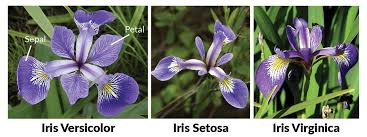



We will be using these 4 columns:
1. Petal Length
2. Petal Width
3. Sepal Length
4. Sepal Width <br/>
<img src="https://www.oreilly.com/library/view/python-artificial-intelligence/9781789539462/assets/462dc4fa-fd62-4539-8599-ac80a441382c.png" />

Since Id is useless, because we have index!

In [5]:
del df_iris["Id"]

In [6]:
df_iris.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SepalLengthCm  150 non-null    float64
 1   SepalWidthCm   150 non-null    float64
 2   PetalLengthCm  150 non-null    float64
 3   PetalWidthCm   150 non-null    float64
 4   Species        150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


**VERY CLEAN DATA**
*  without any nulls values
* Species (the output) has no upper case or lowercase problem <br/>

Done with data understanding and cleaning!

# KMeans

## 1. Init the centroid with the first K rows of the data

In [7]:
def Kmean_init_centroids(K, df):
  centroids = {}
  for i in range(K):
    centroids[int(i)] = df.values[i]
  return centroids

## 2. Init the clusters as empty dictionary with index (type:int) as a key and empty list

In [8]:
def Kmean_init_clusters(K):
  clusters = {}
  for i in range(K):
    clusters[i] = []
  return clusters

## 3. We will just init the K = 3 

In [9]:
# Config
K = 3

## 4. Init colors list for plot kmean graph ( we will just put 10 colors for now)

In [10]:
colors = ["red", "green", "black", "blue", "yellow", "cyan", "purple", "lightblue", "saddlebrown", "springgreen"]

## 5. Init a function to calculate the distance 
### How to calculate the (Euclidean) distance between two centroids? <br />
$$ c1 = (x1, y1) $$<br/>
$$ c2 = (x2, y2) $$ <br />
$$distance = \sqrt[2]{(x1-x2)^2 + (y1-y2)^2}	$$
<font color='blue'>NOTE</font><br/>
1. c1 and c2 length/shape is has to be same  (it does only **NOT** have to be x1,y1 or x2,y2)
2. NO strings in c1 and c2



In [11]:
def Kmean_centroid_dis(c1,c2):
  return(sum( (c1-c2)**2) )**0.5

## 6. Init a temporary df (inputs) without the outputs

In [12]:
df_temp = df_iris.copy() # Deepcopy 
df_temp = df_iris.iloc[:, :4]
df_temp.head()

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [13]:
df_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SepalLengthCm  150 non-null    float64
 1   SepalWidthCm   150 non-null    float64
 2   PetalLengthCm  150 non-null    float64
 3   PetalWidthCm   150 non-null    float64
dtypes: float64(4)
memory usage: 4.8 KB


## 7. Let's use all the initialize variables and function that we use mentioned above

In [14]:
centroids = Kmean_init_centroids(K, df_temp)
centroids

{0: array([5.1, 3.5, 1.4, 0.2]),
 1: array([4.9, 3. , 1.4, 0.2]),
 2: array([4.7, 3.2, 1.3, 0.2])}

In [15]:
clusters = Kmean_init_clusters(K)
clusters

{0: [], 1: [], 2: []}

Looks good. centroids is equal to our first three rows (just like what we mentioned above) because K is 3 and clusters is dict with empty lists!!

### Calculate the distances to all centroids and we wil choose the smallest distance to the centroid

In [16]:
for _, row in df_temp.iterrows():
  dis = []
  for centroid_no in centroids:
    # Get all the distance between all centroids
    centroid_dis = Kmean_centroid_dis(row.values, centroids[centroid_no])
    dis.append(centroid_dis)
  #Only add the minimum distance
  min_dis_index = dis.index(min(dis))
  clusters[min_dis_index].append(row.values)

### Find the center of the clusters

In [17]:
old_centroid = centroids.copy()
           
# move centroid
for cluster_no in clusters:
  cluster_data = clusters[cluster_no]
  new_centroid = np.mean(cluster_data, axis = 0)
  centroids[cluster_no] = new_centroid

### Plot some stuff to visualize our kmean
<font color='blue'>NOTE</font><br/>
https://stackoverflow.com/questions/50452455/plt-show-does-nothing-when-used-for-the-second-time <br/>
Recommended to use ```fig.show()``` instead of ```plt.show```

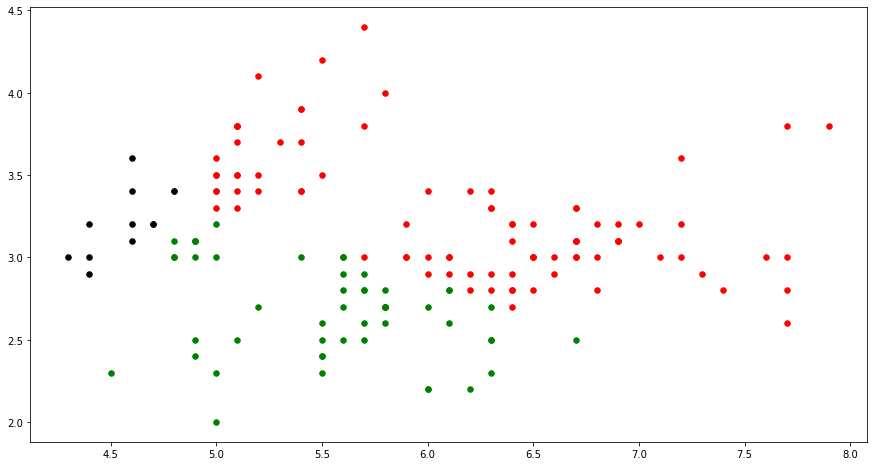

In [18]:
fig = plt.figure(figsize = (15,8))
ax = fig.add_subplot(1,1,1)
# plot all dots
for cluster_no in clusters:
  color = colors[cluster_no]
  for features in clusters[cluster_no]:
    ax.scatter(features[0], features[1], color = color,s = 30, label=f"cluster {cluster_no}")
fig.show()

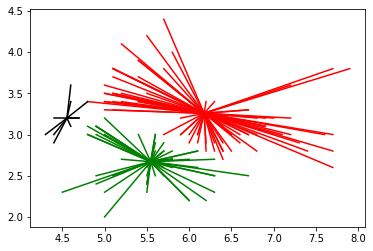

In [19]:
for centroid in centroids:
  # draw the star centroid
  color = colors[centroid]
  ax.scatter(centroids[centroid][0], centroids[centroid][1], s = 130, marker = "*", color = color,label="centroid" )
  class_data= np.array(clusters[centroid])
  # draw lines connecting to centroid
  for cd in class_data:
    point1 = [centroids[centroid][0], cd[0]]
    point2 = [centroids[centroid][1], cd[1]]
    plt.plot(point1, point2, color = color)
fig.show()

### Combine all the code to a function 

In [20]:
def plot_kmean(frame_number, K, df, centroids, animate ):
  clusters = Kmean_init_clusters(K)

  for _, row in df.iterrows():
    dis = []
    for centroid_no in centroids:
      # Get all the distance between all centroids
      centroid_dis = Kmean_centroid_dis(row.values, centroids[centroid_no])
      dis.append(centroid_dis)
    # Only add the minimum distance
    min_dis_index = dis.index(min(dis))
    clusters[min_dis_index].append(row.values)
      
  old_centroid = centroids.copy()
          
  if frame_number > 40 or not animate:
    # move centroid
    for cluster_no in clusters:
      cluster_data = clusters[cluster_no]
      new_centroid = np.mean(cluster_data, axis = 0)
      centroids[cluster_no] = new_centroid

  ax.clear()

  # plot all dots
  for cluster_no in clusters:
      color = colors[cluster_no]
      for features in clusters[cluster_no]:
        ax.scatter(features[0], features[1], color = color,s = 30, label=f"cluster {cluster_no}")

          
  for centroid in centroids:
    # draw the star centroid
      color = colors[centroid]
      ax.scatter(centroids[centroid][0], centroids[centroid][1], s = 130, marker = "*", color = color,label="centroid" )
      class_data= np.array(clusters[centroid])
    
      if frame_number > 20 or not animate:
        # draw lines connecting to centroid for better visualization
        for cd in class_data:
            point1 = [centroids[centroid][0], cd[0]]
            point2 = [centroids[centroid][1], cd[1]]
            plt.plot(point1, point2, color = color)
  ax.set_title(f"Kmean {K}")

  # ref: https://stackoverflow.com/questions/13588920/stop-matplotlib-repeating-labels-in-legend
  # plot distinct legend
  handles, labels = ax.get_legend_handles_labels()
  handle_list, label_list = [], []
  for handle, label in zip(handles, labels):
      if label not in label_list:
          handle_list.append(handle)
          label_list.append(label)
  plt.legend(handle_list, label_list)

  if not animate:
    return centroids, clusters

### If the animate parameter is set to True, COOL stuff happens
**CLICK** the play button to see it


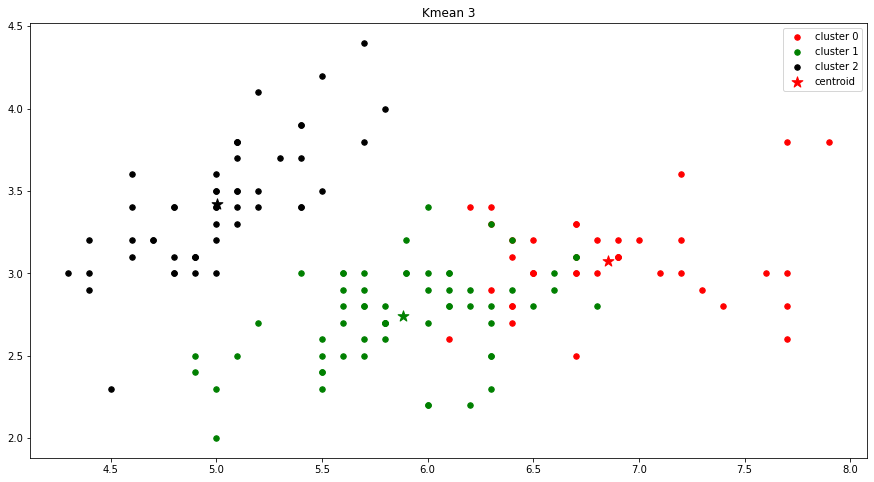

In [21]:
from IPython.display import HTML

fig = plt.figure(figsize = (15,8))
ax = fig.add_subplot(1,1,1)
ani = animation.FuncAnimation(fig, plot_kmean, fargs=(K, df_temp, centroids, True) ,interval=3)
HTML(ani.to_jshtml()) # For GOOGLE COLAB

### 8. How do we know which K is the best ?
With elbow method of inertia and cluster<br/>
**Inertia** is Sum of squared distances of samples to their closest cluster center.


In [22]:
def calculate_inertia(df, centroids, clusters):
  inertia = 0
  for cluster_no in clusters:
    color = colors[cluster_no]
    for features in clusters[cluster_no]:
      inertia += Kmean_centroid_dis(features[:1], centroids[cluster_no][:1])
  return inertia

### How are we going to calculate the optimal K?
Draw the line and do the math !! <br/>
<img src="https://miro.medium.com/max/1012/1*V-SbjR7UcjxFr0XC3B6KLQ.png" /> <br/>
See in line comment for further explaination

In [23]:
def get_elbow_curve(y_axis_list):
  # get the list of coordinates
  num_points = len(y_axis_list)
  # add index to the errors by combining them [ [range(0,19)], [Errors] ]
  all_coords = np.vstack((range(num_points), y_axis_list))
  # Tranform into [ [0, Errors[0], [..,..]]]
  all_coords = all_coords.T

  #get the vector line that we will be comparing to
  vector = all_coords[-1] - all_coords[0]
  # Eculidian Norm 
  vector_norm = vector / np.sqrt(sum(vector**2))


  vector_from_first_point = all_coords - all_coords[0]
  # repmat to produce the vector_norm 18 times and * vector and rmbrt to add axis 1 to remain [ ... ,... ]
  dot_product = np.sum(vector_from_first_point * np.matlib.repmat(vector_norm, num_points, 1), axis=1)
  #  a = [a0, a1, ..., aM] , b = [b0, b1, ..., bN][
  # [a0*b0  a0*b1 ... a0*bN ]
  # [a1*b0    .
  #[ ...          .
  #[aM*b0            aM*bN ]] returns out[i,j] = a[i]*b[j]
  vec_from_first_parallel = np.outer(dot_product, vector_norm)

  vector_to_line = vector_from_first_point - vec_from_first_parallel
  distance_to_line = np.sqrt(np.sum(vector_to_line ** 2, axis=1))
  best_index = np.argmax(distance_to_line)
  return best_index

### 8. Get the inertia when K is from 1 to 5

<font color='red'>WARNING</font><br/>
**If you want to INCREASE THE number of maximum cluster remember to add the more colors to** <br/>
```colors = ["red", "green", "black", "blue", "yellow", "cyan", "purple", "lightblue", "saddlebrown", "springgreen"]```

In [24]:
%%capture
# Above %%capture not to show the plot from plot_kmean 
# Since we only want the centroid and cluster
inertia_list =[]
ks = list(range(1,6))
# Get the inertia list of each K 
for k in ks:
  centroids = Kmean_init_centroids(k, df_temp)
  centroids, clusters = plot_kmean(0, k, df_temp, centroids, False)
  inertia = calculate_inertia(df_temp, centroids, clusters)
  inertia_list.append(inertia)

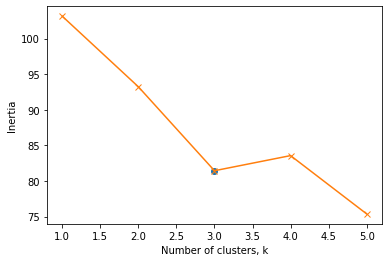

In [25]:
fig, ax = plt.subplots()
elbow_index_of_k_mean = get_elbow_curve(inertia_list)
plt.plot( ks[elbow_index_of_k_mean] , inertia_list[elbow_index_of_k_mean],"-o")
plt.xlabel("Number of clusters, k")
plt.ylabel("Inertia")
ax.plot(ks, inertia_list, "-x")
plt.show()

In [26]:
print(f"Optimal K is {ks[elbow_index_of_k_mean]}")

Optimal K is 3


# Wine

In [27]:
df_wine = pd.read_csv("../data/raw/winequality-red.csv")
df_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


## Understanding wine dataset better

In [28]:
df_wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


**VERY CLEAN DATA**

|Columns| Explanation|
|---|---|
| fixed acidity | most acids involved with wine or fixed or nonvolatile (do not evaporate readily) |
|volatile acidity |the amount of acetic acid in wine, which at too high of levels can lead to an unpleasant, vinegar taste | 
|citric acid|found in small quantities, citric acid can add 'freshness' and flavor to wines|
|residual sugar|the amount of sugar remaining after fermentation stops, it's rare to find wines with less than 1 gram/liter and wines with greater than 45 grams/liter are considered sweet|
|chlorides|the amount of salt in the wine|
|free sulfur dioxide|the free form of SO2 exists in equilibrium between molecular SO2 (as a dissolved gas) and bisulfite ion; it prevents microbial growth and the oxidation of wine|
|total sulfur dioxide|amount of free and bound forms of S02; in low concentrations, SO2 is mostly undetectable in wine, but at free SO2 concentrations over 50 ppm, SO2 becomes evident in the nose and taste of wine|
|density|the density of water is close to that of water depending on the percent alcohol and sugar content|
|pH|describes how acidic or basic a wine is on a scale from 0 (very acidic) to 14 (very basic); most wines are between 3-4 on the pH scale|
|sulphates|a wine additive which can contribute to sulfur dioxide gas (S02) levels, wich acts as an antimicrobial and antioxidant|
|alcohol| alcohol level|
|quality| the quality of the wine|

## For simplicity, let's just choose the first 2 inputs columns

In [29]:
df_wine_temp = df_wine.copy()
df_wine_temp = df_wine_temp.iloc[:, 0:2]

## Find the optimal K

In [30]:
%%capture
# Above %%capture not to show the plot from plot_kmean 
# Since we only want the centroid and cluster
inertia_list =[]
ks = list(range(1,5))
# Get the inertia list of each K 
for k in ks:
  centroids = Kmean_init_centroids(k, df_wine_temp)
  centroids, clusters = plot_kmean(0, k, df_wine_temp, centroids, False)
  inertia = calculate_inertia(df_wine_temp, centroids, clusters)
  inertia_list.append(inertia)

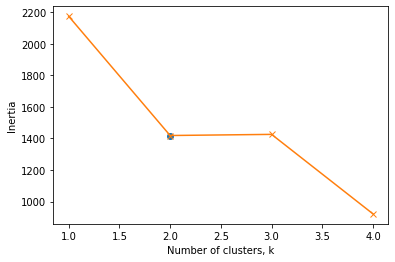

In [31]:
fig, ax = plt.subplots()
elbow_index_of_k_mean = get_elbow_curve(inertia_list)
plt.plot( ks[elbow_index_of_k_mean] , inertia_list[elbow_index_of_k_mean],"-o")
plt.xlabel("Number of clusters, k")
plt.ylabel("Inertia")
ax.plot(ks, inertia_list, "-x")
plt.show()

In [32]:
optimal_k = ks[elbow_index_of_k_mean]
print(f"Optimal K is {optimal_k}")

Optimal K is 2


### For some fun, lets randomize the initialize the random centroids

In [33]:
import random
def Kmean_init_random_centroids(k, df):
  index_list = random.sample(range(k, df.shape[0]),k)
  centroids = {}
  for i in range(k):
    centroids[int(i)] = df.values[index_list[i]]
  return centroids

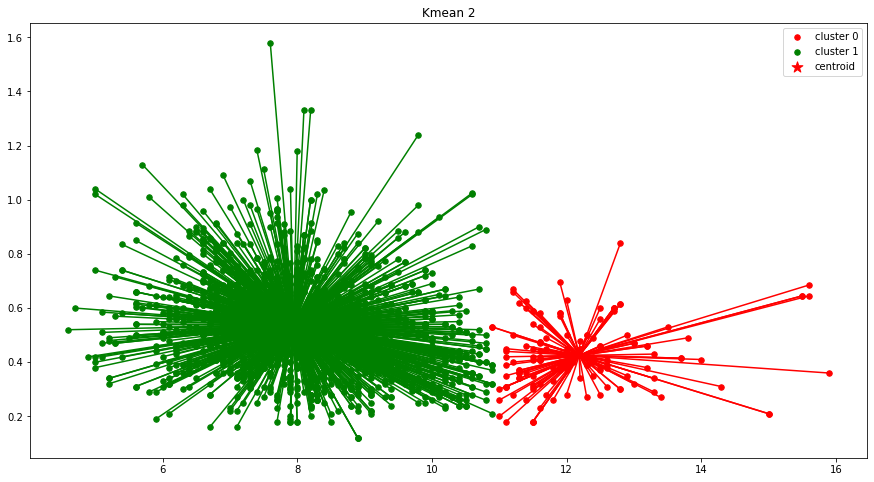

In [34]:
fig = plt.figure(figsize = (15,8))
ax = fig.add_subplot(1,1,1)
centroids = Kmean_init_random_centroids(optimal_k, df_wine_temp)
ani = animation.FuncAnimation(fig, plot_kmean, fargs=(optimal_k, df_wine_temp, centroids, False) ,interval=3)
plt.show()